# Integrated location assessment for data centers

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import matplotlib.colors as mcolors
import numpy as np
import cartopy.crs as ccrs
import cartopy.io.shapereader as shpreader
from cartopy.mpl.gridliner import LONGITUDE_FORMATTER, LATITUDE_FORMATTER

In [2]:
# Read data

criteria_weight = pd.read_csv('input/assessment_criteria_weight.csv')
criteria_data = pd.read_csv('input/assessment_criteria_data.csv', index_col=0)

In [3]:
# Chart paramter
plt.rcParams['font.family'] = 'sans-serif'
plt.rcParams['font.sans-serif'] = ['Arial']
plt.rcParams['mathtext.fontset'] = 'custom'
plt.rcParams['mathtext.rm'] = 'Arial'
plt.rcParams['xtick.direction'] = 'out'
plt.rcParams['ytick.direction'] = 'out'
plt.rcParams['xtick.major.width'] = 2.0
plt.rcParams['ytick.major.width'] = 2.0
plt.rcParams['xtick.major.size'] = 7.0
plt.rcParams['ytick.major.size'] = 7.0
plt.rcParams['font.size'] = 20
plt.rcParams['xtick.labelsize'] = 18
plt.rcParams['ytick.labelsize'] = 18
plt.rcParams['axes.linewidth'] = 0.0

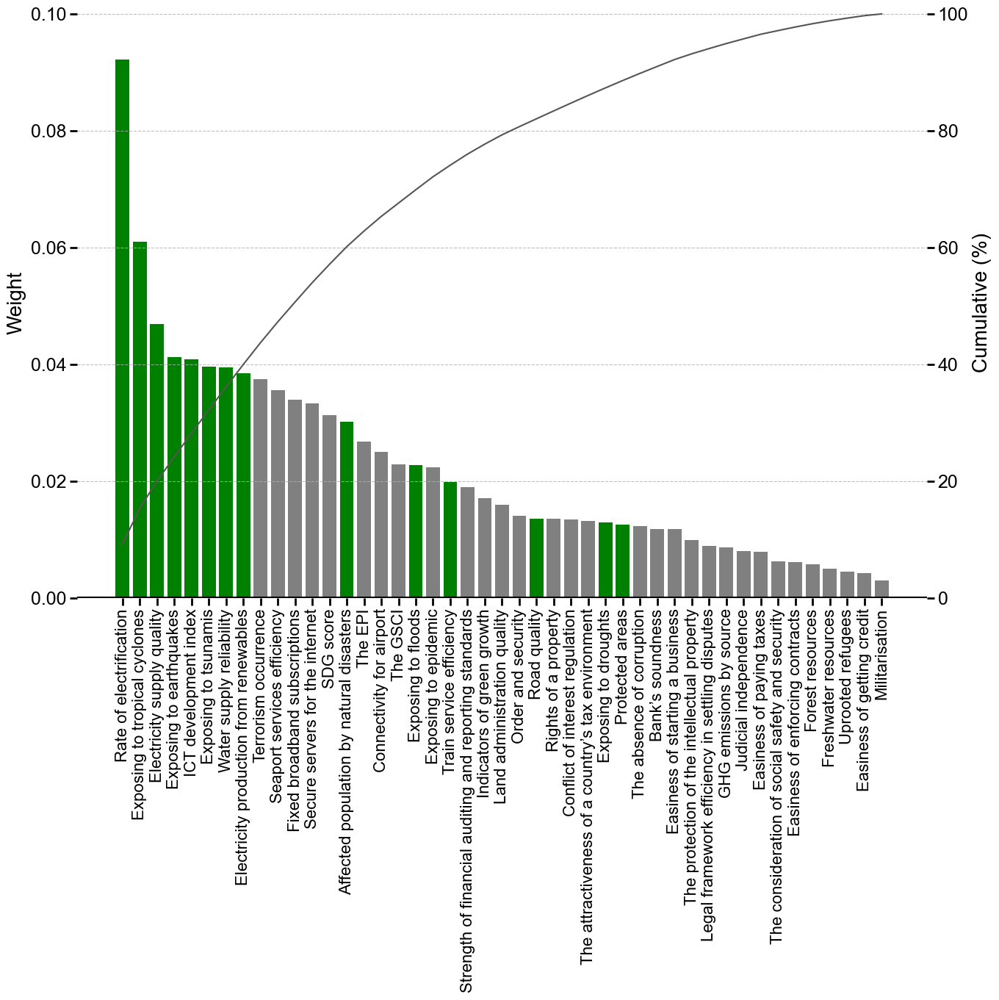

In [ ]:
# Draw pareto chart of decision weights of regional criteria
# Data from https://doi.org/10.1016/j.jclepro.2024.141982

df = criteria_weight[criteria_weight['resolution'] != 'National'].sort_values(by='weight', ascending=False)
df['cumulative_weight'] = df['weight'].cumsum() / df['weight'].sum() * 100
colors = ['gray' if flag == "Not considered" else 'Green' for flag in df['consideration status']]

fig, ax1 = plt.subplots(figsize=(10, 10))

# Weight
ax1.bar(df['criterion'], df['weight'], color=colors)
ax1.set_ylabel('Weight')
ax1.set_xticks(range(len(df)))
ax1.set_xticklabels(df['criterion'], rotation=90)
ax1.set_ylim(0, 0.101)

# Cumulative
ax2 = ax1.twinx()
ax2.plot(df['criterion'], df['cumulative_weight'], color='#555')
ax2.set_ylabel('Cumulative (%)')
ax2.set_ylim(0, 101)

ax2.axhline(0, color='#000', linestyle='-', linewidth=3)

plt.grid(axis='y', linestyle='--', alpha=0.8)
plt.tight_layout()
plt.savefig("output/criteria_pareto.jpg", bbox_inches='tight', pad_inches=0, transparent=False, dpi=300)
plt.show()

In [96]:
# Draw map

def map_plot(map_data, map_label, cmap, map_min, map_max, threshold, map_title):

    # Boundary
    municipal_shapes = list(shpreader.Reader("input/shp/1741municipalities/1741municipalities.shp").geometries())
    japan_shapes = list(shpreader.Reader("input/shp/Japan/Japan.shp").geometries())

    # Colormap
    if map_max == "max":
        color_max = map_data.max()
    else:
        color_max = map_max

    if map_min == "min":
        color_min = map_data.min()
    else:
        color_min = map_min

    # Colormap
    if threshold == 'binary':
        norm = mcolors.Normalize(vmin=color_min, vmax=color_max)
        cmap = mcolors.ListedColormap([cmap(norm(0)), cmap(norm(1))])
        bounds = [-0.001, 0.5, 1.001]
        norm = mcolors.BoundaryNorm(bounds, cmap.N)
    elif threshold is not None:
        norm = mcolors.TwoSlopeNorm(vmin=color_min, vcenter=threshold, vmax=color_max)
    else:
        norm = mcolors.Normalize(vmin=color_min, vmax=color_max)

    # Map
    fig = plt.figure(figsize=(21, 21), dpi=300)
    ax = plt.axes(projection=ccrs.PlateCarree())

    # Regional polygon
    for n, city in enumerate(municipal_shapes):
        value = min(map_data.iloc[n], color_max)
        value = max(value, color_min)
        polygon_color = cmap(norm(value)) if value is not np.NaN else "#ddd"
        ax.add_geometries(city, ccrs.PlateCarree(), edgecolor=(0.1,0.1,0.1,0.5), facecolor=polygon_color, linewidth = 0.0, zorder=1)

    area_cood = [126.6, 147.0, 25.6, 45.9]
    ax.set_extent(area_cood, crs=ccrs.PlateCarree())
    ax.add_geometries(japan_shapes, ccrs.PlateCarree(), edgecolor=(0.1,0.1,0.1,0.5), facecolor=(0,0,0,0), linewidth = 0.5, zorder=2)

    # Gridline
    gl = ax.gridlines(draw_labels=True, linewidth=0.6, color='gray', alpha=0.6, linestyle='--')
    gl.top_labels = True
    gl.right_labels = False
    gl.bottom_labels = False
    gl.left_labels = True
    gl.xlabel_style = {'fontsize': 24, 'color': "gray"}
    gl.ylabel_style = {'fontsize': 24, 'color': "gray"}
    gl.xformatter = LONGITUDE_FORMATTER
    gl.yformatter = LATITUDE_FORMATTER
    
    # Draw
    heat_map = ax.imshow([[color_min],[color_max]], cmap=cmap, norm=norm)
    cbar = fig.colorbar(heat_map, shrink=0.78, aspect=35, pad=0.02, orientation='horizontal')
    cbar.set_label(map_label, fontsize=32, labelpad=17)
    cbar.ax.tick_params(labelsize=28)
    cbar.ax.set_xscale('linear')
    if threshold == 'binary':
        cbar.set_ticks([0.25,0.75])
        cbar.set_ticklabels(["Not available", "Available"])

    plt.axis('off')
    if map_title is not None:
        plt.savefig("output/%s.jpg" % (map_title), bbox_inches='tight', pad_inches=0, transparent=False, dpi=300)
    plt.show()
    plt.clf()

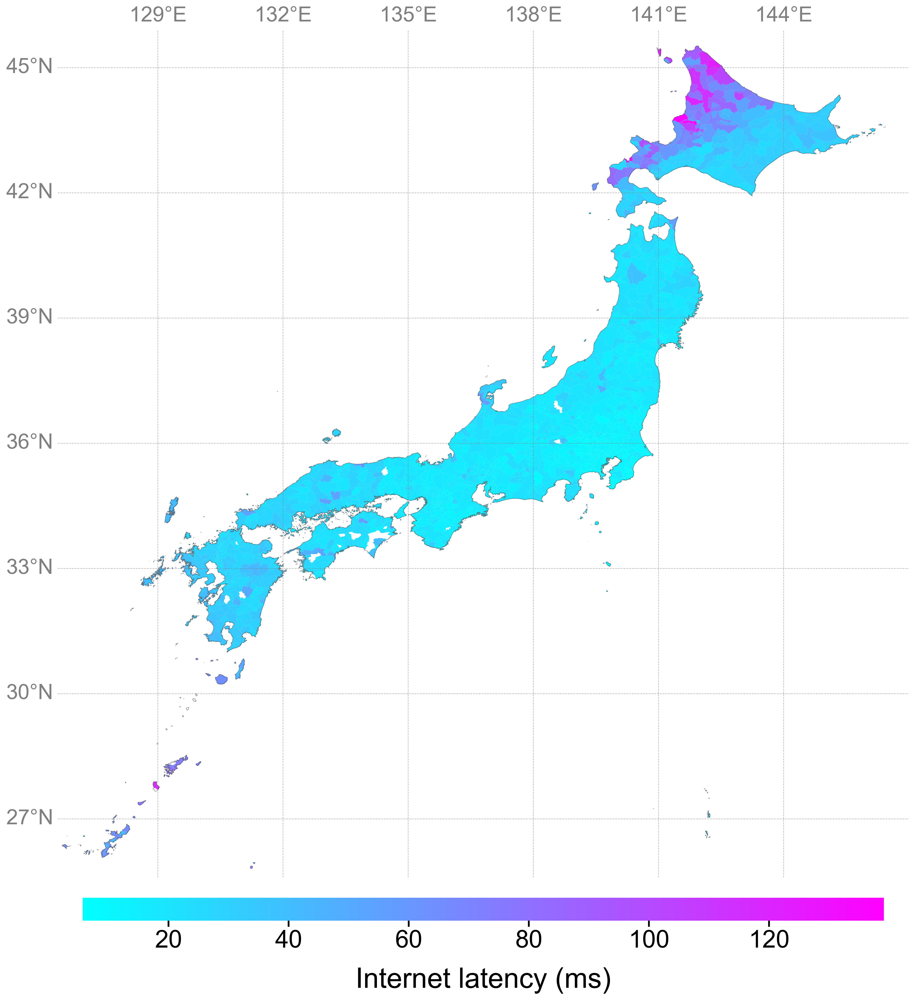

<Figure size 640x480 with 0 Axes>

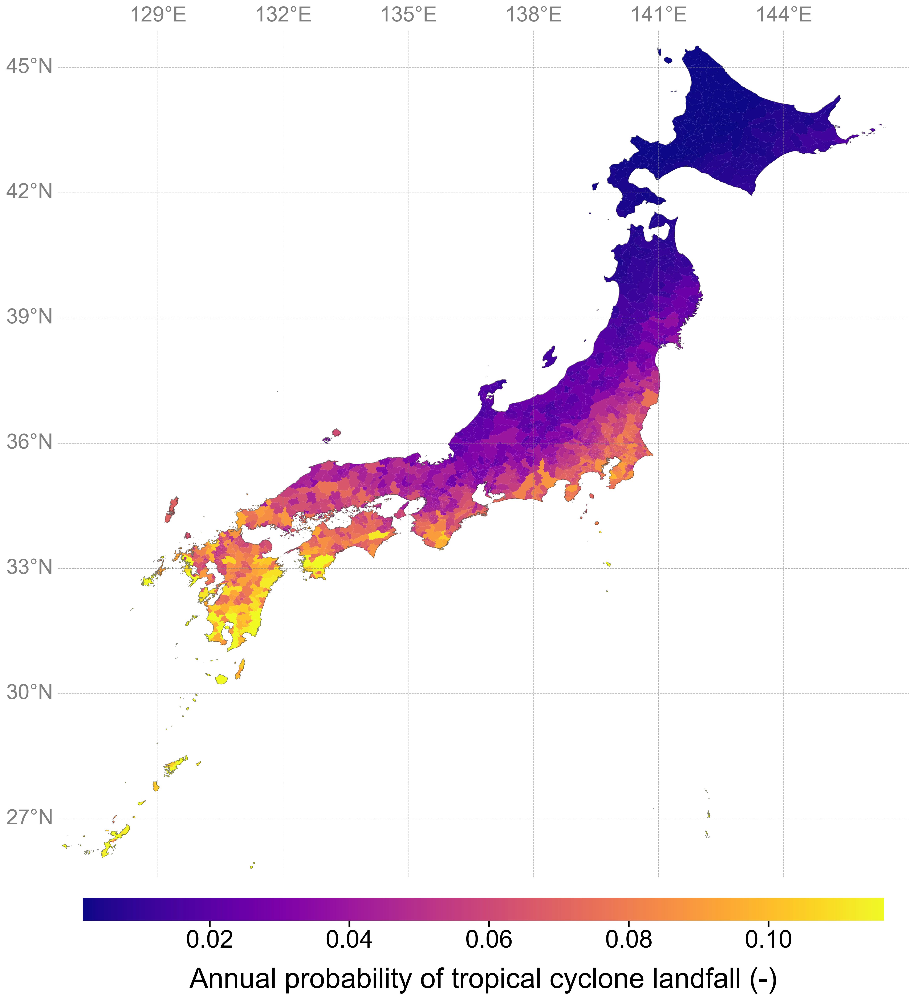

<Figure size 640x480 with 0 Axes>

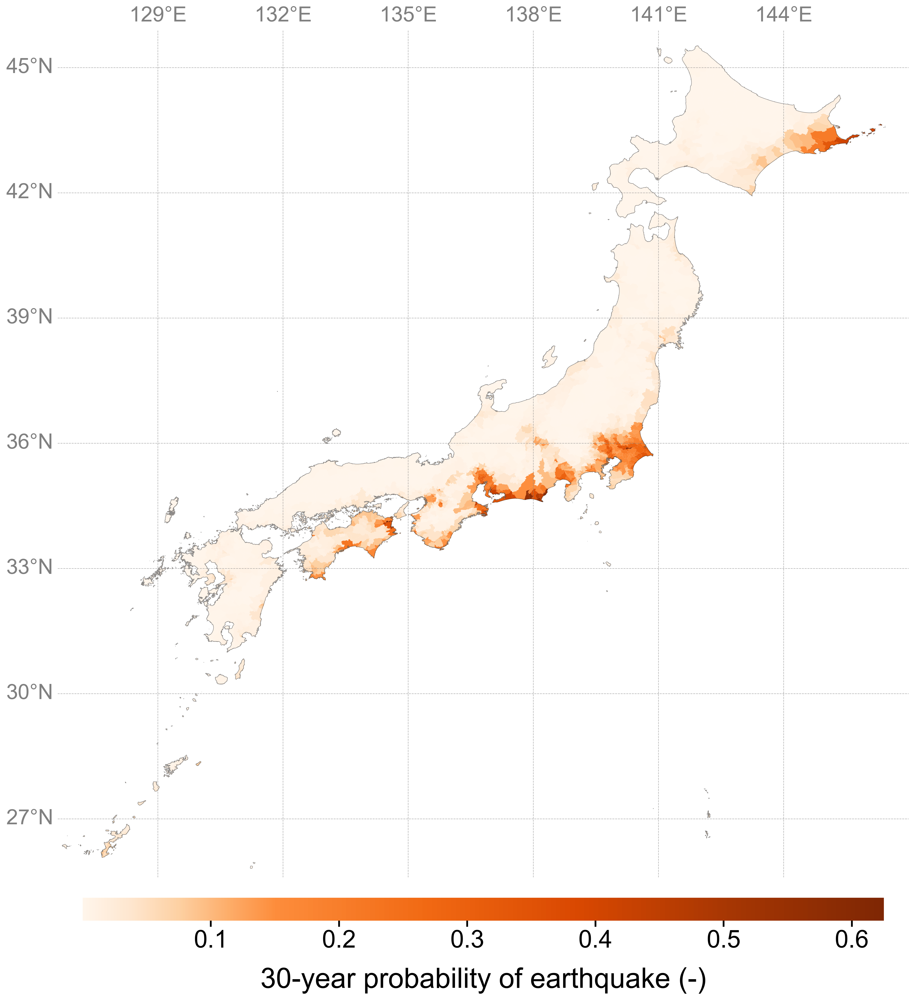

<Figure size 640x480 with 0 Axes>

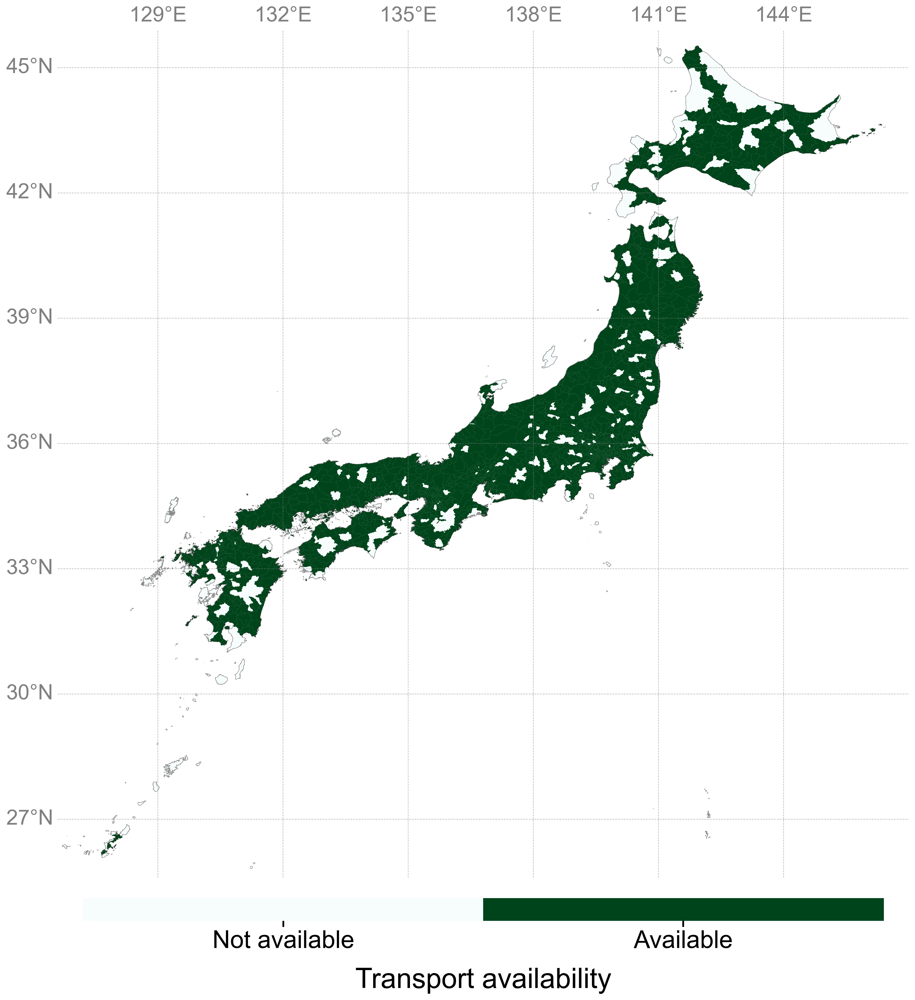

<Figure size 640x480 with 0 Axes>

In [97]:
# Map

criteria = {
    'latency':{'title':'Internet latency (ms)','color':cm.cool,'min':0,'max':1,'threshold':None,'name':'map_latency'},
    'cyclone':{'title':'Annual probability of tropical cyclone landfall (-)','color':cm.plasma,'min':0.025,'max':0.975,'threshold':None,'name':'map_cyclone'},
    'earthquake':{'title':'30-year probability of earthquake (-)','color':cm.Oranges,'min':0,'max':1,'threshold':0.15,'name':'map_earthquake'},
    'transport':{'title':'Transport availability','color':cm.BuGn,'min':0,'max':1,'threshold':'binary','name':'map_transport'}
}

for factor in criteria.keys():    
    data = criteria_data[factor]
    prop = criteria[factor]
    map_plot(data, prop['title'], prop['color'], data.quantile(prop['min']), data.quantile(prop['max']), prop['threshold'], prop['name'])

Data center siting potential: 41.8 km2
Data center siting potential: 87143.8 MW


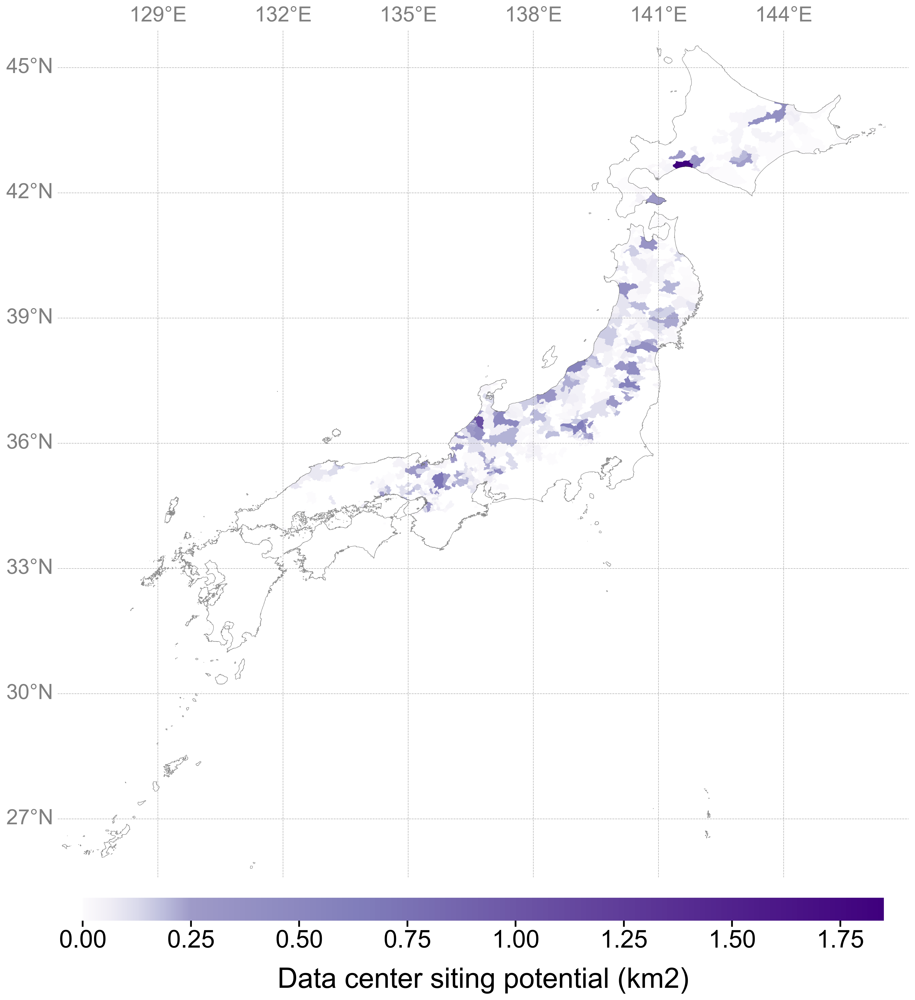

<Figure size 640x480 with 0 Axes>

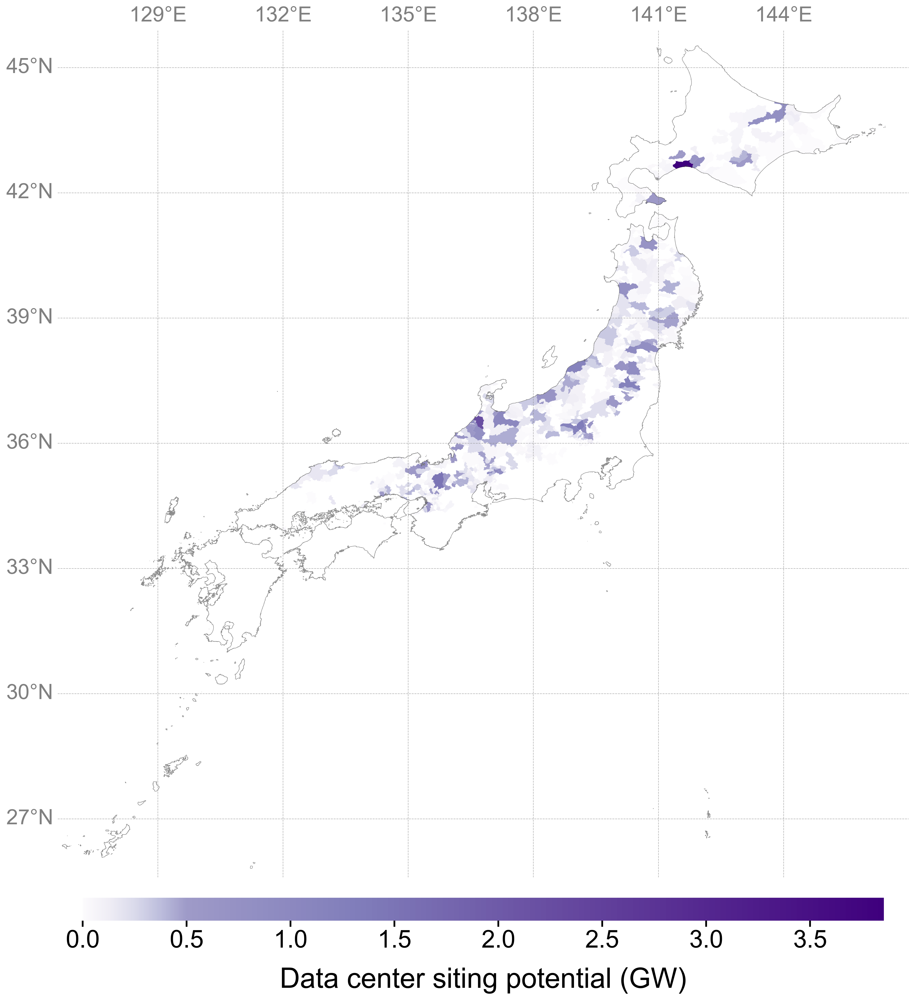

<Figure size 640x480 with 0 Axes>

In [98]:
# Integrated location assessment


# Available and safe industrial area (Availability: 5%)
location_potential = criteria_data['safe_industrial_area'] * 0.05

# Exclude cyclone risk municipalities (more than 5% landfall probability in a year)
location_potential = location_potential * criteria_data['cyclone'].apply(lambda x: 1 if x < 0.05 else np.NaN)

# Exclude municipalities with poor transport access
criteria_data['transport'] = criteria_data['station'] + criteria_data['highway']
location_potential = location_potential * criteria_data['transport'].apply(lambda x: 1 if x > 0 else np.NaN)

# Exclude municipalities with poor ICT infrastructure ("the median (of gamers) are able to detect delays around 51-90 ms" (Raaen, 2014))
location_potential = location_potential * criteria_data['latency'].apply(lambda x: 1 if x <= 50 else np.NaN) 

# km2 -> MW
DC_density = 480 / 1000000 # km2/MW
location_potential_MW = location_potential / DC_density
print("Data center siting potential:", location_potential.sum().round(1), "km2")
print("Data center siting potential:", location_potential_MW.sum().round(1), "MW")

# Draw map
map_plot(location_potential, 'Data center siting potential (km2)', cm.Purples, 'min', 'max', 0.25, f"map_DC_potential_km2")
map_plot(location_potential_MW/1000, 'Data center siting potential (GW)', cm.Purples, 'min', 'max', 0.5, f"map_DC_potential_GW")

# Export
location_potential_MW.to_csv('output/datacenter_potential.csv', header=['MW'])